In [178]:
import warnings
warnings.filterwarnings("ignore")

## Contexte :

Les micro-organismes sont répertoriés par nom de genre - nom de l'espèce - nom de souche.
Par exemple Escherichia Coli BL21.

La base de données téléIcare qui sert de support aux déclarations contient seulement genre et espèce.
Dans la nouvelle version compl'Alim nous souhaitons ajouter la souche (à choisir parmi une liste de souches déjà déclarées, ou à compléter si non répertoriée).

Pour cela nous étudions et nettoyons le champ des souches déjà déclarées.

In [179]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [181]:
moorg_df = pd.read_csv("../../investigations_data/ICA_MICRO_ORGANISME.csv", encoding="utf-16")
moorg_df.describe()

,INGR_IDENT,MORG_IDENT,INGMORG_QUANTITE_PAR_DJR
count,15906.000000,15906.000000,1.585900e+04
mean,410568.873695,43.527914,4.273895e+11
std,212379.884801,27.053144,2.306933e+13
min,17.000000,1.000000,1.000000e+00
25%,241022.250000,17.000000,3.450000e+08
50%,415238.500000,48.000000,1.200000e+09
75%,597931.250000,69.000000,3.320000e+09
max,759751.000000,91.000000,2.375000e+15


In [182]:
ref_moorg_df = pd.read_csv("../../investigations_data/REF_ICA_MICRO_ORGANISME.csv", encoding="utf-16")
ref_moorg_df.columns

Index(['MORG_IDENT', 'FCTINGR_IDENT', 'STINGSBS_IDENT', 'MORG_ESPECE',
       'MORG_COMMENTAIRE_PUBLIC', 'MORG_COMMENTAIRE_PUBLIC_EN',
       'MORG_COMMENTAIRE_PRIVE', 'MORG_COMMENTAIRE_PRIVE_EN', 'MORG_ORDRE',
       'MORG_OBSOLET', 'MORG_GENRE'],
      dtype='object')

In [80]:
# Il n'y a pas de Micro-organisme déclarés obsolètes
ref_moorg_df[ref_moorg_df["MORG_OBSOLET"]==True]

,MORG_IDENT,FCTINGR_IDENT,STINGSBS_IDENT,MORG_ESPECE,MORG_COMMENTAIRE_PUBLIC,MORG_COMMENTAIRE_PUBLIC_EN,MORG_COMMENTAIRE_PRIVE,MORG_COMMENTAIRE_PRIVE_EN,MORG_ORDRE,MORG_OBSOLET,MORG_GENRE


In [81]:
# Tous les micro-organismes ont la même fonction
ref_moorg_df["FCTINGR_IDENT"].nunique()

1

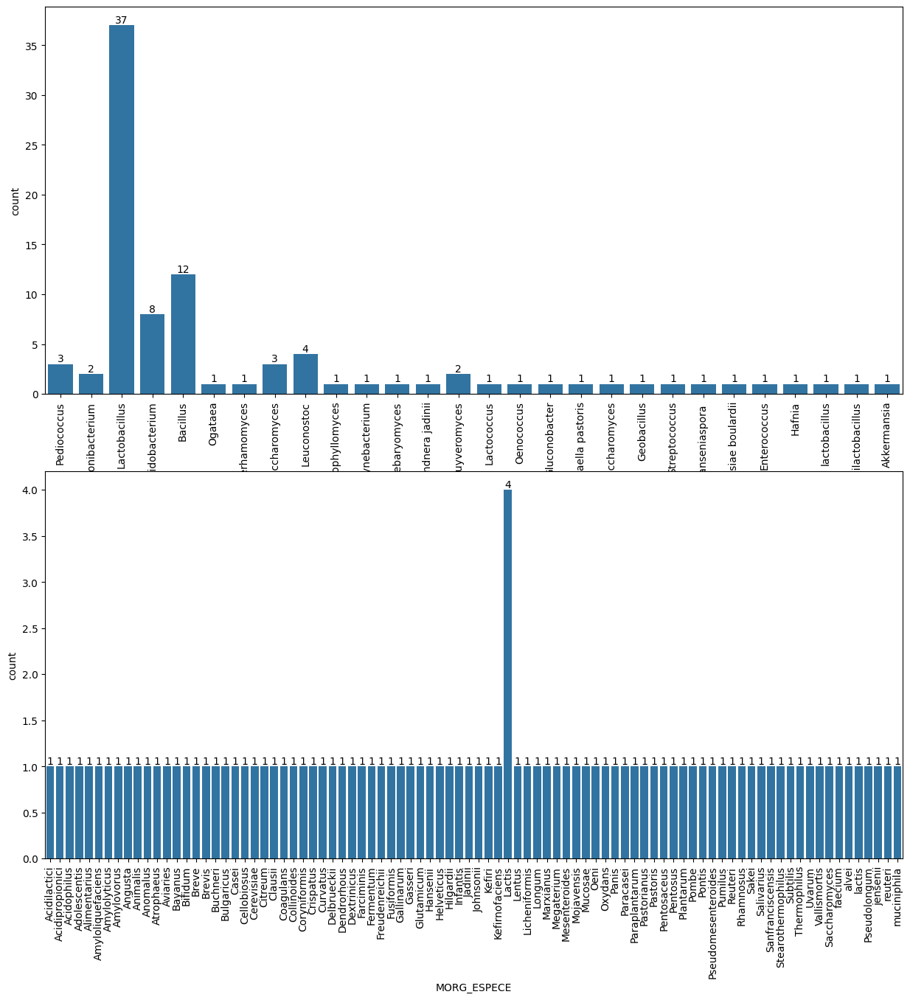

In [77]:
# Il y a 91 micro-organismes différents listés
ref_moorg_df.count()
fig, axes = plt.subplots(2,1, figsize=(15,15))

sns.countplot(ref_moorg_df, x="MORG_GENRE", ax=axes[0])
axes[0].bar_label(axes[0].containers[0])
axes[0].tick_params(axis='x', labelrotation=90)

sns.countplot(ref_moorg_df, x="MORG_ESPECE", ax=axes[1])
axes[1].bar_label(axes[1].containers[0])
axes[1].tick_params(axis='x', labelrotation=90)

fig.show()


In [104]:
# clean "MORG_GENRE" et "MORG_ESPECE" => toujours 91

ref_moorg_df["MORG_GENRE"] = ref_moorg_df["MORG_GENRE"].apply(lambda x : x.lower().strip())
ref_moorg_df["MORG_ESPECE"] = ref_moorg_df["MORG_ESPECE"].apply(lambda x : x.lower().strip())

ref_moorg_df.groupby(["MORG_GENRE", "MORG_ESPECE"]).count()


MORG_IDENT  FCTINGR_IDENT  \
MORG_GENRE            MORG_ESPECE                                      
akkermansia           muciniphila                   1              1   
bacillus              amyloliquefaciens             1              1   
                      atrophaeus                    1              1   
                      clausii                       1              1   
                      coagulans                     1              1   
                      fusiformis                    1              1   
                      lentus                        1              1   
                      licheniformis                 1              1   
                      megaterium                    1              1   
                      mojavensis                    1              1   
                      pumilus                       1              1   
                      subtilis                      1              1   
                      vallismortis                  1              1   
bifidobacterium       adolescentis                  1              1   
                      animalis                      1              1   
                      bifidum                       1              1   
                      breve                         1              1   
                      infantis                      1              1   
                      lactis                        1              1   
                      longum                        1              1   
                      pseudolongum                  1              1   
cerevisiae boulardii  saccharomyces                 1              1   
corynebacterium       glutamicum                    1              1   
debaryomyces          hansenii                      1              1   
enterococcus          faecium                       1              1   
geobacillus           stearothermophilus            1              1   
gluconobacter         oxydans                       1              1   
hafnia                alvei                         1              1   
hanseniaspora         uvarum                        1              1   
kluyveromyces         lactis                        1              1   
                      marxianus                     1              1   
komagataella pastoris pastoris                      1              1   
lactobacillus         acidophilus                   1              1   
                      alimentarius                  1              1   
                      amylolyticus                  1              1   
                      amylovorus                    1              1   
                      aviaries                      1              1   
                      brevis                        1              1   
                      buchneri                      1              1   
                      bulgaricus                    1              1   
                      casei                         1              1   
                      cellobiosus                   1              1   
                      collinoides                   1              1   
                      coryniformis                  1              1   
                      crispatus                     1              1   
                      curvatus                      1              1   
                      delbrueckii                   1              1   
                      farciminis                    1              1   
                      fermentum                     1              1   
                      gallinarum                    1              1   
                      gasseri                       1              1   
                      helveticus                    1              1   
                      hilgardii                     1              1   
                      jensenii                      1              1   
           

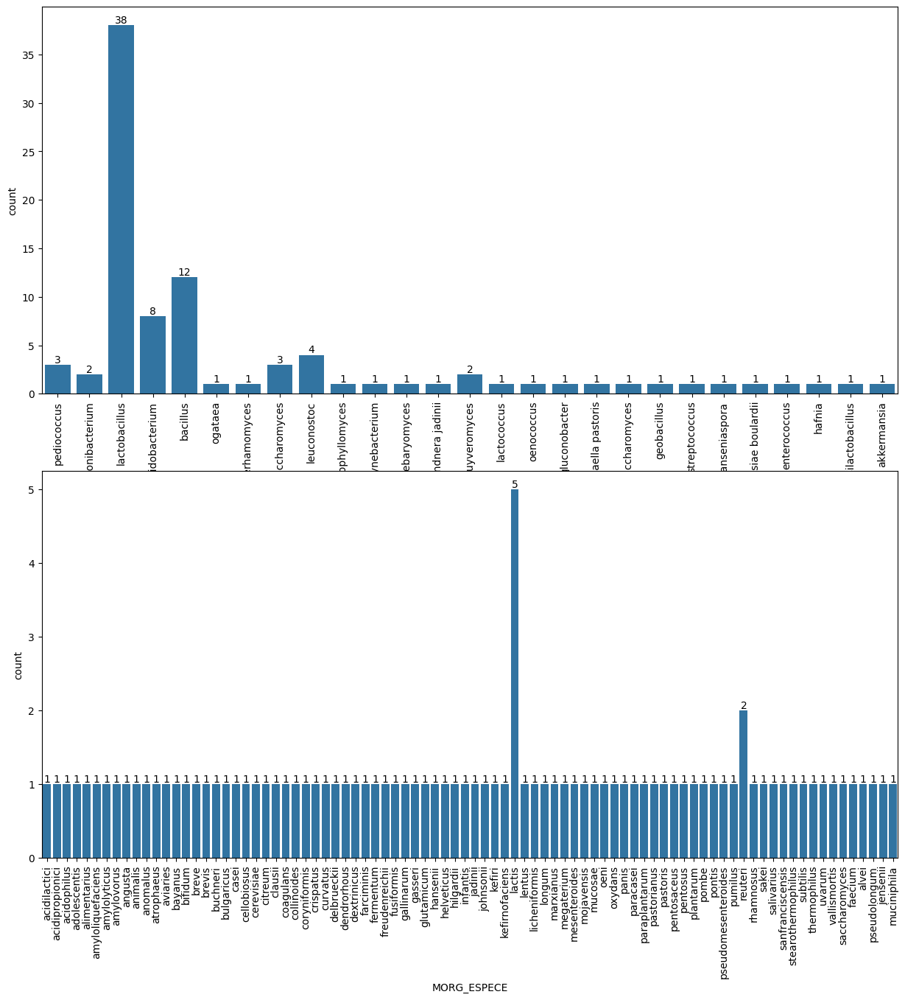

In [105]:
# Il y a 91 micro-organismes différents listés
fig, axes = plt.subplots(2,1, figsize=(15,15))

sns.countplot(ref_moorg_df, x="MORG_GENRE", ax=axes[0])
axes[0].bar_label(axes[0].containers[0])
axes[0].tick_params(axis='x', labelrotation=90)

sns.countplot(ref_moorg_df, x="MORG_ESPECE", ax=axes[1])
axes[1].bar_label(axes[1].containers[0])
axes[1].tick_params(axis='x', labelrotation=90)

fig.show()


In [95]:
# 3237 souches différentes renseignées avant cleaning
moorg_df.INGMORG_SOUCHE.value_counts().count()

3237

In [125]:
# clean des souches
# lowercase
moorg_df["INGMORG_SOUCHE"] = moorg_df["INGMORG_SOUCHE"].apply(lambda x: ' '.join(x.lower().strip().split()) if not pd.isnull(x) else x)



In [126]:
# 2990 souches différentes renseignées après lower()
# 2947 souches différentes renseignées après strip ()
# 2944 souches différentes renseignées après suppression des multiples espaces ()
moorg_df.INGMORG_SOUCHE.value_counts().count()

2944

In [109]:
pd.set_option('display.max_rows', 100)
moorg_df.INGMORG_SOUCHE.value_counts()[:100]


INGMORG_SOUCHE
lactobacillus                                                    323
lactobacillus acidophilus                                        259
lactobacillus rhamnosus                                          241
saccharomyces cerevisiae                                         200
lmg 25626                                                        194
lmg 8151                                                         191
lactobacillus casei                                              183
bifidobacterium                                                  182
bifidobacterium bifidum                                          169
lmg 26652                                                        166
lactobacillus plantarum                                          153
lmg 25628                                                        148
lmg 26655                                                        145
lmg 27352                                                        136
bifidobacterium lon

In [176]:
# Jointure des 2 DF
moorg_merged_df = pd.merge(moorg_df, ref_moorg_df)


In [177]:
moorg_merged_df = moorg_merged_df[["MORG_IDENT","MORG_GENRE", "MORG_ESPECE", "INGMORG_SOUCHE", "INGMORG_QUANTITE_PAR_DJR"]]
moorg_merged_df

,MORG_IDENT,MORG_GENRE,MORG_ESPECE,INGMORG_SOUCHE,INGMORG_QUANTITE_PAR_DJR
0,35,propionibacterium,freudenreichii,freudenreichii,5.000000e+00
1,43,bifidobacterium,infantis,bifdobacterium infantis synbalance bi,1.000000e+09
2,48,bifidobacterium,lactis,bifidobacterium lactis bb-12,1.000000e+09
3,75,lactobacillus,rhamnosus,lactobacillus rhamnosus gg,1.000000e+09
4,75,lactobacillus,rhamnosus,lactobacillus rhamnosus r11,2.200000e+09
5,20,lactobacillus,casei,lactobacillus casei r215,2.000000e+09
6,3,lactobacillus,acidophilus,lactobacillus acidophilus r52,8.000000e+08
7,50,lactococcus,lactis,lactococcus lactis r1058,5.000000e+08
8,81,streptococcus,thermophilus,streptococcus thermophilus r1018,5.000000e+08
9,54,bifidobacterium,longum,bifidobacterium longum r175,5.000000e+08


In [164]:
# cleaning des souches en supprimant le genre et l'espèce
# TODO : mettre ce qui est entre parenthèse ailleurs

# non connue = inconnue = non précisée = -  
def clean_field(souche, genre, espece):
    if not pd.isnull(souche):
        only_souche = souche.replace(genre, "").replace(espece, "")
        only_souche_dedup = only_souche.replace("pasteurisée", "pasteurisé")\
            .replace("confidentielle", "confidentiel")\
            .replace("non connue", "non précisée").replace("inconnue", "non précisée")\
            .strip()
        return re.sub(r"^\((.*?)\)$", r"\1", only_souche_dedup)

    else:
        return souche

moorg_merged_df["INGMORG_SOUCHE_CLEANED"] = moorg_merged_df.apply(lambda x: clean_field(x['INGMORG_SOUCHE'], x['MORG_GENRE'], x['MORG_ESPECE']), axis=1)


In [166]:
moorg_merged_df.INGMORG_SOUCHE_CLEANED.value_counts().count()

# 2669 après suppression des genre et espèce du nom de souche + 
# 2664 après déduplication des default values
# 2651 après suppression des parenthèses aux extrêmités

2651

In [167]:
pd.set_option('display.max_rows', 500)
moorg_merged_df.INGMORG_SOUCHE_CLEANED.value_counts()[:500]


INGMORG_SOUCHE_CLEANED
                                                                                                                      3083
confidentiel                                                                                                           211
lmg 25626                                                                                                              194
lmg 8151                                                                                                               191
non précisée                                                                                                           184
lmg 26652                                                                                                              169
lmg 25628                                                                                                              148
lmg 26655                                                                                                           

In [173]:
# Retrouver pour chaque genre - espèce, les souches les plus courantes
pd.set_option('display.max_rows', None)
moorg_merged_df.groupby(['MORG_GENRE', 'MORG_ESPECE', 'INGMORG_SOUCHE_CLEANED']).count()

MORG_IDENT  \
MORG_GENRE           MORG_ESPECE        INGMORG_SOUCHE_CLEANED                                           
akkermansia          muciniphila        atcc baanon précisée835                                      4   
                                        atcc baanon précisée835, cip 107961                          1   
                                        pasteurisé                                                   2   
bacillus             clausii            sin                                                          1   
                     coagulans                                                                      41   
                                        10000000000                                                  1   
                                        atbnon préciséebcsnon précisée042                            1   
                                        atcc 7050 / lmg 6326                                         2   
                                        atcc 750 / lmg 6326                                          1   
                                        b                                                            1   
                                        baconon précisée17                                           1   
                                        bacterium                                                    1   
                                        bactérie                                                     1   
                                        bactérie sporogène                                           1   
                                        bactérie sprogènes                                           1   
                                        bactérie sprorogène                                          1   
                                        bc09                                                         1   
                                        bc10                                                         2   
                                        bc4                                                          4   
                                        bc513                                                        5   
                                        bc513 lmg snon précisée24828                                 5   
                                        bc5138                                                       1   
                                        bc99                                                         2   
                                        bcm9'                                                        1   
                                        bl03                                                         1   
                                        cncm: inon précisée3799                                      1   
                                        code                                                         1   
                                        cogulans lmg 6326 atcc 7050                                  1   
                                        confidentiel                                                 2   
                                        fermented rice bran                                          3   
                                        fermentée                                                    3   
                                        gbinon précisée30                                            1   
                                        gbinon précisée30 6086                                      36   
                                        lacto  sporulé                                               1   
                                        lacto sporogenes                                            12   
                                        lactospore                                                   5   
                                        lactospore 15           

In [170]:
moorg_merged_df.groupby(['MORG_GENRE', 'MORG_ESPECE']).agg(
    {"INGMORG_SOUCHE_CLEANED": pd.Series.nunique})

INGMORG_SOUCHE_CLEANED
MORG_GENRE           MORG_ESPECE                               
akkermansia          muciniphila                              3
bacillus             clausii                                  1
                     coagulans                               50
                     subtilis                                26
bifidobacterium      adolescentis                            16
                     animalis                               121
                     bifidum                                164
                     breve                                  124
                     infantis                               106
                     lactis                                 202
                     longum                                 186
                     pseudolongum                             3
cerevisiae boulardii saccharomyces                           65
debaryomyces         hansenii                                 1
enterococcus         faecium                                 20
geobacillus          stearothermophilus                       1
hafnia               alvei                                    2
kluyveromyces        marxianus                                4
lactobacillus        acidophilus                            304
                     amylolyticus                             1
                     amylovorus                               2
                     brevis                                  37
                     buchneri                                 1
                     bulgaricus                              67
                     casei                                  164
                     coryniformis                             1
                     crispatus                               50
                     curvatus                                 3
                     delbrueckii                             33
                     fermentum                               64
                     gasseri                                 87
                     helveticus                              94
                     jensenii                                 6
                     johnsonii                               13
                     kefiri                                   1
                     lactis                                  32
                     paracasei                              147
                     paraplantarum                            1
                     pentosus                                 4
                     plantarum                              272
                     reuteri                                123
                     rhamnosus                              339
                     sakei                                    7
                     salivarius                              86
lactococcus          lactis                                  82
leuconostoc          mesenteroides                            3
limosilactobacillus  reuteri                                  7
pediococcus          acidilactici                            17
                     pentosaceus                              8
propionibacterium    freudenreichii                           8
saccharomyces        cerevisiae                              90
streptococcus        thermophilus                           141